# Analysis of wet lab data and reordering working designs

### Boilerplate

In [1]:
%load_ext lab_black
# python internal
import collections
import copy
import gc
from glob import glob
import h5py
import itertools
import os
import random
import re
import socket
import shutil
import subprocess
import sys

# conda/pip
import dask
import graphviz
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy
import seaborn as sns
from tqdm import tqdm

# special packages on the DIGS
import py3Dmol
import pymol
import pyrosetta

# notebook magic
%matplotlib inline
%load_ext autoreload
%autoreload 2

print(os.getcwd())
print(socket.gethostname())

/mnt/home/pleung/projects/bistable_bundle/r4/helix_binders
dig140


### Load dataframe of ordered designs

In [2]:
to_order_df = pd.read_json(
    os.path.join(os.getcwd(), "07_to_order", "final_scores.json"), dtype="float"
)

### Get Cullen's too

In [3]:
to_order_2 = pd.read_json(
    "/home/cdemakis/to_order/hinges/071921/scores_final.json", dtype="float"
)

### Standardizing column names between mine and Cullen's dataframes

In [4]:
to_drop = [
    "cart_bonded_Y",
    "coordinate_constraint_Y",
    "lddt_af2_X",
    "lddt_des_pred_X",
    "sap_X",
    "rmsd_pred_X",
    "pred_prefix",
]

to_order_df.drop(to_drop, axis=1, inplace=True)

print(f"changing: {set(to_order_df) - set(to_order_2)}")

changing: {'tot_score_C', 'sap_D', 'sap_A', 'tot_score_X', 'tot_score_B', 'sap_Y', 'tot_score_A', 'tot_score_D', 'chC_resis', 'twosided_Y_resis', 'sap_B', 'chD_resis', 'abspath', 'onesided_Y_resis', 'sap_C'}


In [5]:
to_drop_2 = [
    "HIS_burial_X",
    "HIS_burial_Y",
    "TRP_burial_X",
    "TRP_burial_Y",
    "avg_lddt_X",
    "avg_lddt_Y",
    "buried_HIS_X",
    "buried_HIS_Y",
    "d_SAP_complex_formation",
    "d_lddt_complex_formation",
    "d_tot_complex_formation",
    "defaultscorename",
    "lddt_AX",
    "lddt_AY",
    "lddt_BX",
    "lddt_BY",
    "lddt_X",
    "lddt_X_nocys",
    "lddt_Y",
    "lddt_Y_nocys",
    "lddt_onesidedY",
    "lddt_twosidedY",
    "near_TRP_aro_X",
    "near_TRP_aro_Y",
    "near_int_GLY_X",
    "near_int_GLY_Y",
    "state_nodock",
    "final_score_Y",
]

to_rename_2 = {
    "06_pdb": "abspath",
    "SAP_ABY": "sap_Y",
    "SAP_AX": "sap_A",
    "SAP_AY": "sap_C",
    "SAP_BX": "sap_B",
    "SAP_BY": "sap_D",
    "chAY_resis": "chC_resis",
    "chBY_resis": "chD_resis",
    "final_score_AX": "tot_score_A",
    "final_score_AY": "tot_score_C",
    "final_score_BX": "tot_score_B",
    "final_score_BY": "tot_score_D",
    "final_score_X": "tot_score_X",
    "onesidedY_resis": "onesided_Y_resis",
    "twosidedY_resis": "twosided_Y_resis",
}

to_order_2.drop(to_drop_2, axis=1, inplace=True)
to_order_2.rename(columns=to_rename_2, inplace=True)
print(
    f"remaining mismatches: {set(to_order_2) - set(to_order_df)} {set(to_order_df) - set(to_order_2)}"
)

remaining mismatches: set() set()


### Concatenate dataframes

In [6]:
aggregate_df = pd.concat([to_order_df, to_order_2])
aggregate_df.head()

,abspath,9mer_X,9mer_Y,X_nocys_path,X_path,X_seq,Y_nocys_path,Y_path,Y_seq,abego_str_Y,...,twosided_Y_resis,vbuns_X,vbuns_Y,wnm_all_X,wnm_all_Y,wnm_hlx_X,wnm_hlx_Y,state,chA_seq,chB_seq
cs_001,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.371368,2.777783,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,MSSDEEEARELIERAKEAAERAQEAAERTGDPRVRELARELKRLAQ...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,MSSDEEEARELIERAKEAAERAQEAAERTGDPRVRELARELKRLAQ...,XBAAAAAAAAAAAAAAAAAAAAAAAAAAAGBAAAAAAAAAAAAAAA...,...,"False,False,False,False,False,False,False,Fals...",0.0,0.0,0.413241,0.766133,0.109577,0.109287,hDHR79_5CWP_p_4_s_3_d_3,MSSDEEEARELIERAKEAAERAQEAAERTGDPRVRELARELKRLAQ...,SESNEKKKLMEELKKTAKELSETVQKL
cs_002,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.386789,2.755677,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDEKVRRIAREVAKQLRRLAEE...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDEKVRRIAREVAKQLRRLAEE...,XAAAAAAAAAAAAAAAAAAAAAABABAAAAAAAAAAAAAAAAAAAA...,...,"False,False,False,False,False,False,False,Fals...",0.0,0.0,0.359860,0.531998,0.122666,0.112582,DHR26_nocys_p_4_s_3_d_3,DEEERLRQEVEKAEKELEKLAKQSTDEKVRRIAREVAKQLRRLAEE...,DEQEELIKEAEKVIKELEKLARQ
cs_003,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.255094,2.642489,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,PELEEWIRRAKEVAKEVEKVAQRAEEEGNPDLRDLAKELRRAVEEA...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,PELEEWIRRAKEVAKEVEKVAQRAEEEGNPDLRDLAKELRRAVEEA...,XAAAAAAAAAAAAAAAAAAAAAAAAAAGBAAAAAAAAAAAAAAAAA...,...,"False,False,False,False,False,False,False,Fals...",0.0,0.0,0.270968,0.514442,0.141927,0.121116,hDHR76_5CWO_p_4_s_3_d_3,PELEEWIRRAKEVAKEVEKVAQRAEEEGNPDLRDLAKELRRAVEEA...,PERNELLKEARKVAEKLYRIAQQAHK
cs_004,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.386789,2.750463,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDPRVRKLAREVAKQLRRLAEE...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDPRVRKLAREVAKQLRRLAEE...,XAAAAAAAAAAAAAAAAAAAAAABABAAAAAAAAAAAAAAAAAAAA...,...,"False,False,False,False,False,False,False,Fals...",0.0,0.0,0.346831,0.716114,0.106338,0.139656,DHR26_nocys_p_4_s_-4_d_5,DEEERLRQEVEKAEKELEKLAKQSTDPRVRKLAREVAKQLRRLAEE...,SEEIEEARKAIKVMLEVLRRMLQ
cs_005,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.386789,2.712187,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDEEVRKLLREVAKQLRRLAEE...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDEEVRKLLREVAKQLRRLAEE...,XAAAAAAAAAAAAAAAAAAAAAABABAAAAAAAAAAAAAAAAAAAA...,...,"False,False,False,False,False,False,False,Fals...",0.0,0.0,0.395295,0.650458,0.103877,0.104197,DHR26_nocys_p_4_s_-4_d_3,DEEERLRQEVEKAEKELEKLAKQSTDEEVRKLLREVAKQLRRLAEE...,SRIKELLEEIKKLLKKVEKVSKQ


### Augment dataframe with wet lab data and picks to further characterize based on that data

In [7]:
picks_df = pd.read_csv(
    os.path.join(os.getcwd(), "07_to_order", "picks.csv"),
    index_col="name",
    # dtype="float"
)
picks_df.drop(
    [c for c in picks_df.columns if "Unnamed:" in c] + ["state"], axis=1, inplace=True
)
picks_df.head()

augmented_df = pd.merge(aggregate_df, picks_df, left_index=True, right_index=True)

out_path = os.path.join(os.getcwd(), "08_analysis")
os.makedirs(out_path, exist_ok=True)
augmented_df.to_csv(os.path.join(out_path, "picks.csv"), index_label="name")

### Make functions to domesticate sequences uses Ryan's `domesticator`

In [8]:
def cmd_no_stderr(command, wait=True):
    """@nrbennet @bcov @pleung"""
    the_command = subprocess.Popen(
        command,
        shell=True,
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        universal_newlines=True,
    )
    if not wait:
        return
    the_stuff = the_command.communicate()
    return str(the_stuff[0])


def capture_1shot_domesticator(stdout: str) -> str:
    """split input into lines.
    loop once through discarding lines up to ones including >.
    return joined output"""
    sequence = []
    append = False
    for line in stdout.splitlines():
        if append:
            sequence.append(line)
        else:
            pass
        if ">unknown_seq1" in line:
            append = True
        else:
            pass
    to_return = "".join(sequence)
    return to_return


def generate_potential_kmers(seq: str) -> list:
    from itertools import combinations

    # len k is 8
    k = 8
    kmers = [
        seq[x:y]
        for x, y in combinations(range(len(seq) + 1), r=2)
        if len(seq[x:y]) == k
    ]

    return kmers

### Reload csv for order

In [8]:
to_order = pd.read_csv(
    os.path.join(os.getcwd(), "08_analysis/picks.csv"), index_col="name"
)
to_order.head()

,abspath,9mer_X,9mer_Y,X_nocys_path,X_path,X_seq,Y_nocys_path,Y_path,Y_seq,abego_str_Y,...,state,chA_seq,chB_seq,well,trafo_or_express,pulldown,sec,order_genes,synthesize_peptide,notes
name,,,,,,,,,,,,,,,,,,,,,
cs_001,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.371368,2.777783,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,MSSDEEEARELIERAKEAAERAQEAAERTGDPRVRELARELKRLAQ...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,MSSDEEEARELIERAKEAAERAQEAAERTGDPRVRELARELKRLAQ...,XBAAAAAAAAAAAAAAAAAAAAAAAAAAAGBAAAAAAAAAAAAAAA...,...,hDHR79_5CWP_p_4_s_3_d_3,MSSDEEEARELIERAKEAAERAQEAAERTGDPRVRELARELKRLAQ...,SESNEKKKLMEELKKTAKELSETVQKL,0A1,False,0,Unknown,False,False,NaN
cs_002,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.386789,2.755677,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDEKVRRIAREVAKQLRRLAEE...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDEKVRRIAREVAKQLRRLAEE...,XAAAAAAAAAAAAAAAAAAAAAABABAAAAAAAAAAAAAAAAAAAA...,...,DHR26_nocys_p_4_s_3_d_3,DEEERLRQEVEKAEKELEKLAKQSTDEKVRRIAREVAKQLRRLAEE...,DEQEELIKEAEKVIKELEKLARQ,0A2,False,0,Unknown,False,False,NaN
cs_003,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.255094,2.642489,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,PELEEWIRRAKEVAKEVEKVAQRAEEEGNPDLRDLAKELRRAVEEA...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,PELEEWIRRAKEVAKEVEKVAQRAEEEGNPDLRDLAKELRRAVEEA...,XAAAAAAAAAAAAAAAAAAAAAAAAAAGBAAAAAAAAAAAAAAAAA...,...,hDHR76_5CWO_p_4_s_3_d_3,PELEEWIRRAKEVAKEVEKVAQRAEEEGNPDLRDLAKELRRAVEEA...,PERNELLKEARKVAEKLYRIAQQAHK,0A3,True,0,Unknown,False,False,NaN
cs_004,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.386789,2.750463,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDPRVRKLAREVAKQLRRLAEE...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDPRVRKLAREVAKQLRRLAEE...,XAAAAAAAAAAAAAAAAAAAAAABABAAAAAAAAAAAAAAAAAAAA...,...,DHR26_nocys_p_4_s_-4_d_5,DEEERLRQEVEKAEKELEKLAKQSTDPRVRKLAREVAKQLRRLAEE...,SEEIEEARKAIKVMLEVLRRMLQ,0A4,True,0,Unknown,False,False,NaN
cs_005,/mnt/home/pleung/projects/bistable_bundle/r4/h...,0.386789,2.712187,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDEEVRKLLREVAKQLRRLAEE...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,/mnt/home/pleung/projects/bistable_bundle/r4/h...,DEEERLRQEVEKAEKELEKLAKQSTDEEVRKLLREVAKQLRRLAEE...,XAAAAAAAAAAAAAAAAAAAAAABABAAAAAAAAAAAAAAAAAAAA...,...,DHR26_nocys_p_4_s_-4_d_3,DEEERLRQEVEKAEKELEKLAKQSTDEEVRKLLREVAKQLRRLAEE...,SRIKELLEEIKKLLKKVEKVSKQ,0A5,True,0,Unknown,False,False,NaN


### Reverse translate designs to order
add intra-CDS RBS site between seqs, scarless GS overhanges for GGA

In [10]:
prefix = "GHHHHHHGS"  # N-terminal minimal HIS tag
suffix = "**"  # C-terminal STOP
peptide_prefix = "SGGS"  # N-terminal linker to GFP
peptide_suffix = "SGGS"  # C-terminal linker to HIS tag
with open(
    os.path.join(os.getcwd(), "08_analysis", "hinges.fasta"), "w+"
) as hinge_fasta:
    for index, row in tqdm(to_order.iterrows()):
        if not row["order_genes"]:
            continue
        else:
            pass
        chA = row["chA_seq"]
        fully_domesticated = capture_1shot_domesticator(
            cmd_no_stderr(
                f"./domesticator.py {prefix+chA+suffix} --avoid_restriction_sites BsaI XhoI NdeI --avoid_patterns AGGAGG GCTGGTGG ATCTGTT GGRGGT YYYYYYNNNNNNNATG --avoid_kmers 8 --avoid_kmers_boost 10 --species e_coli"
            )
        )
        hinge_fasta.write(f">{index}_A\n" + fully_domesticated + "\n")
with open(
    os.path.join(os.getcwd(), "08_analysis", "peptides.fasta"), "w+"
) as peptide_fasta:
    for index, row in tqdm(to_order.iterrows()):
        if not row["order_genes"]:
            continue
        else:
            pass
        chB = row["chB_seq"]
        fully_domesticated = capture_1shot_domesticator(
            cmd_no_stderr(
                f"./domesticator.py {peptide_prefix+chB+peptide_suffix} --avoid_restriction_sites BsaI XhoI NdeI --avoid_patterns AGGAGG GCTGGTGG ATCTGTT GGRGGT YYYYYYNNNNNNNATG --avoid_kmers 8 --avoid_kmers_boost 10 --species e_coli"
            )
        )
        peptide_fasta.write(f">{index}_B\n" + fully_domesticated + "\n")

120it [01:11,  1.68it/s]
120it [00:57,  2.09it/s]


### Make list of peptides to synthesize in house

In [11]:
with open(
    os.path.join(os.getcwd(), "08_analysis", "peptides.list"), "w+"
) as peptide_list:
    for index, row in tqdm(to_order.iterrows()):
        if not row["synthesize_peptide"]:
            continue
        else:
            pass
        chB = row["chB_seq"]
        peptide_list.write(f"{index}_B\n" + chB + "\n")

120it [00:00, 10129.54it/s]


### Unused blocks

In [10]:
bound_df = to_order[to_order["order_genes"] == True]

<ipython-input-17-64728089ac12>:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(16, 16), tight_layout=True)


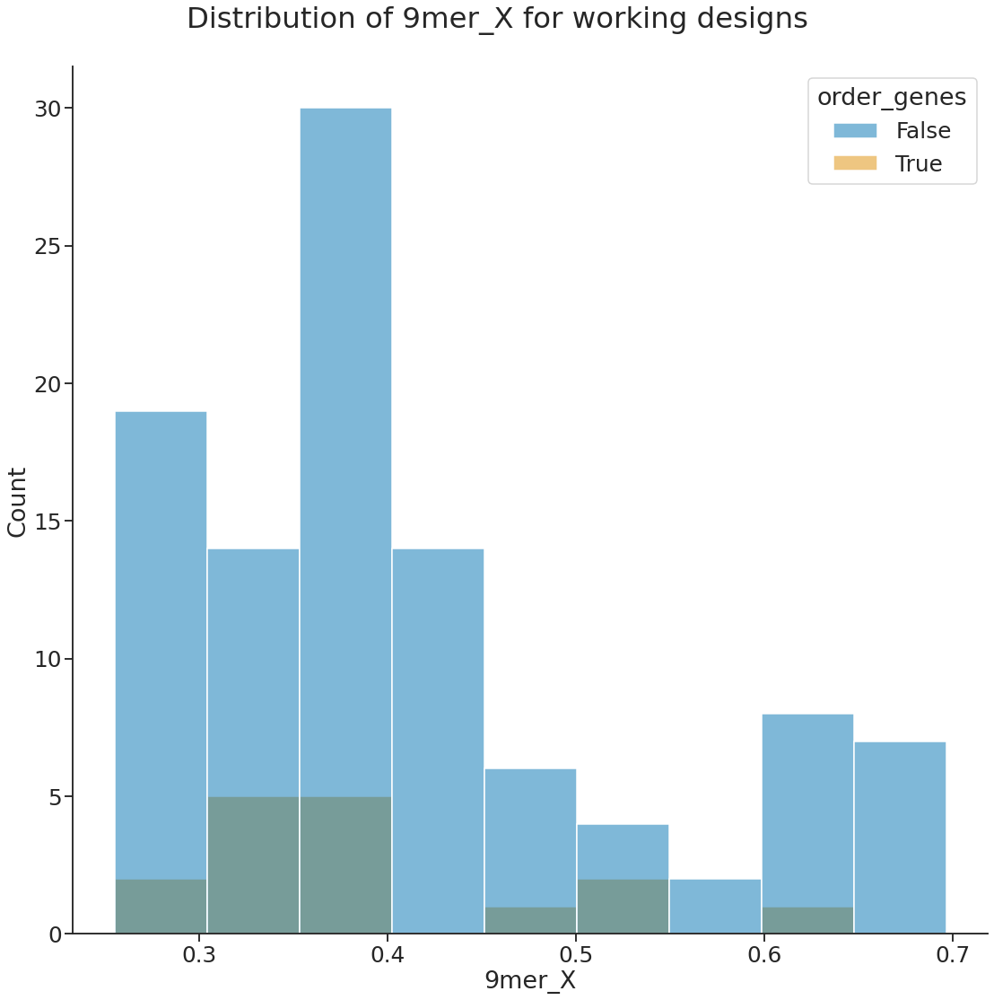

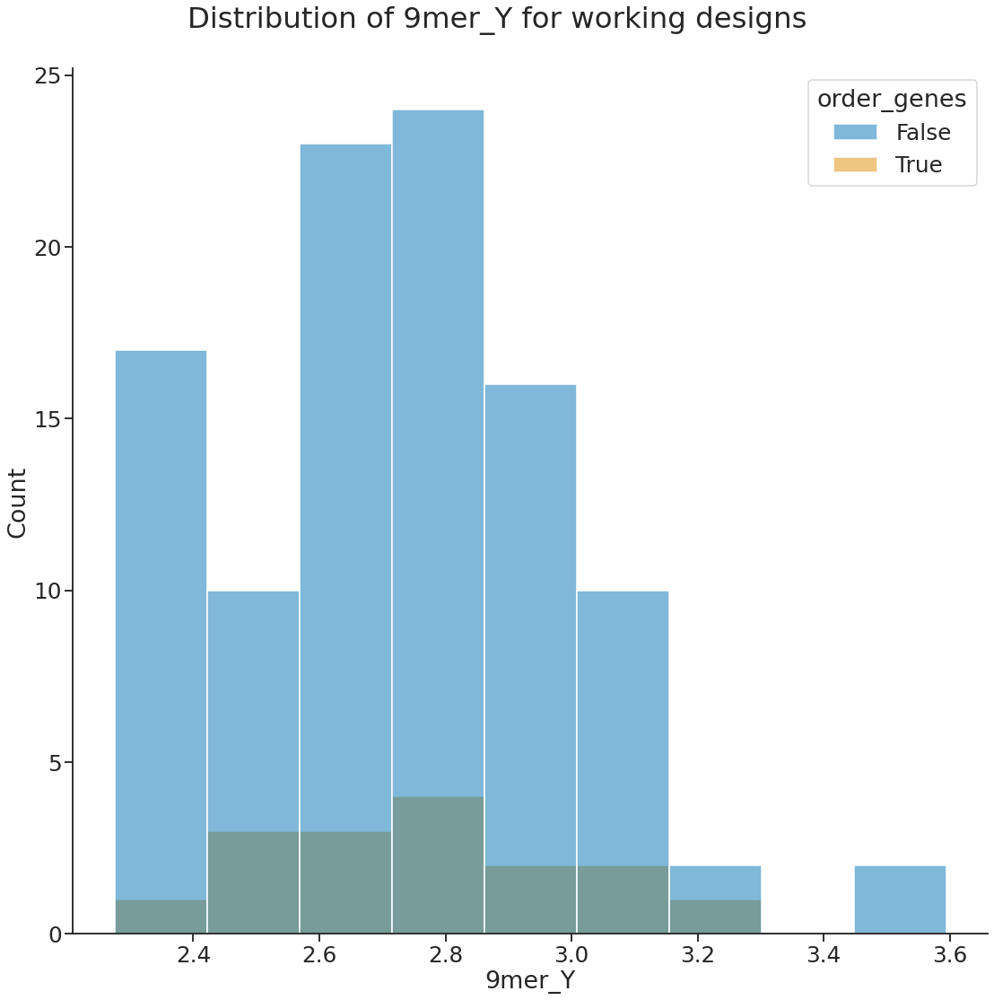

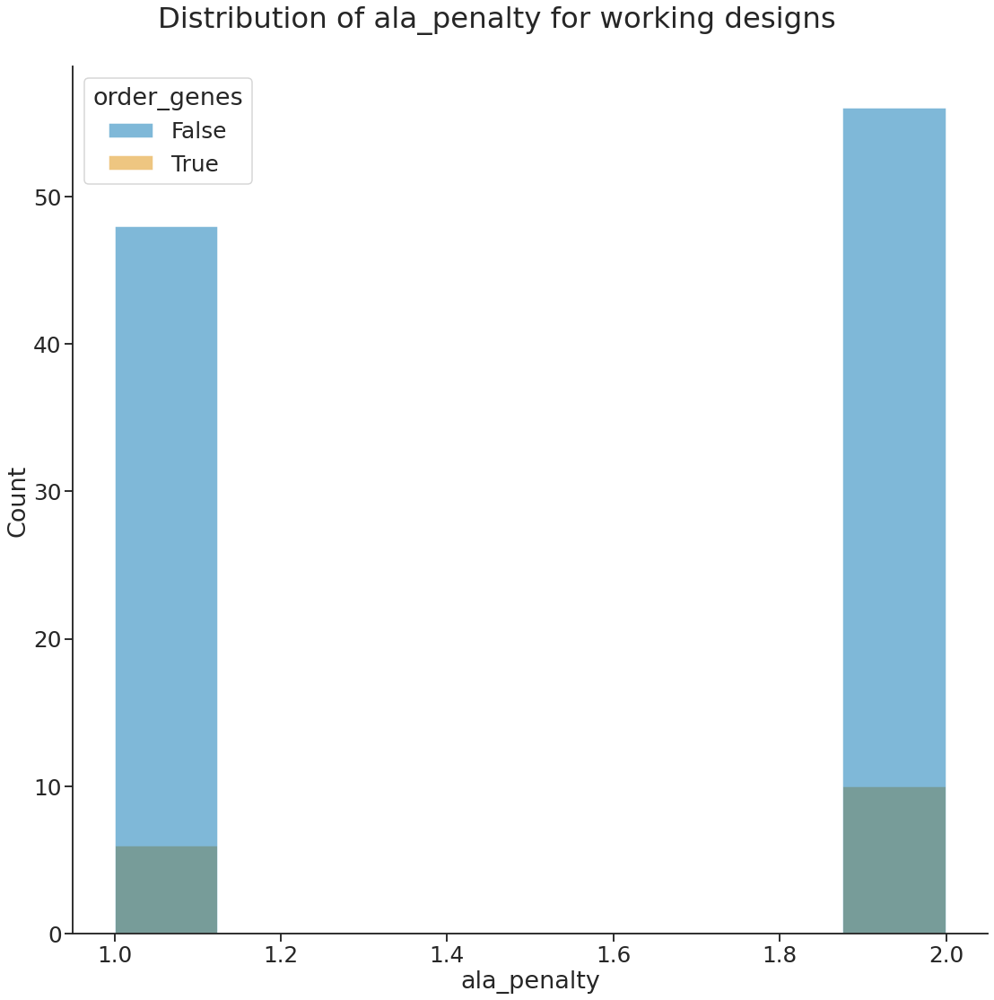

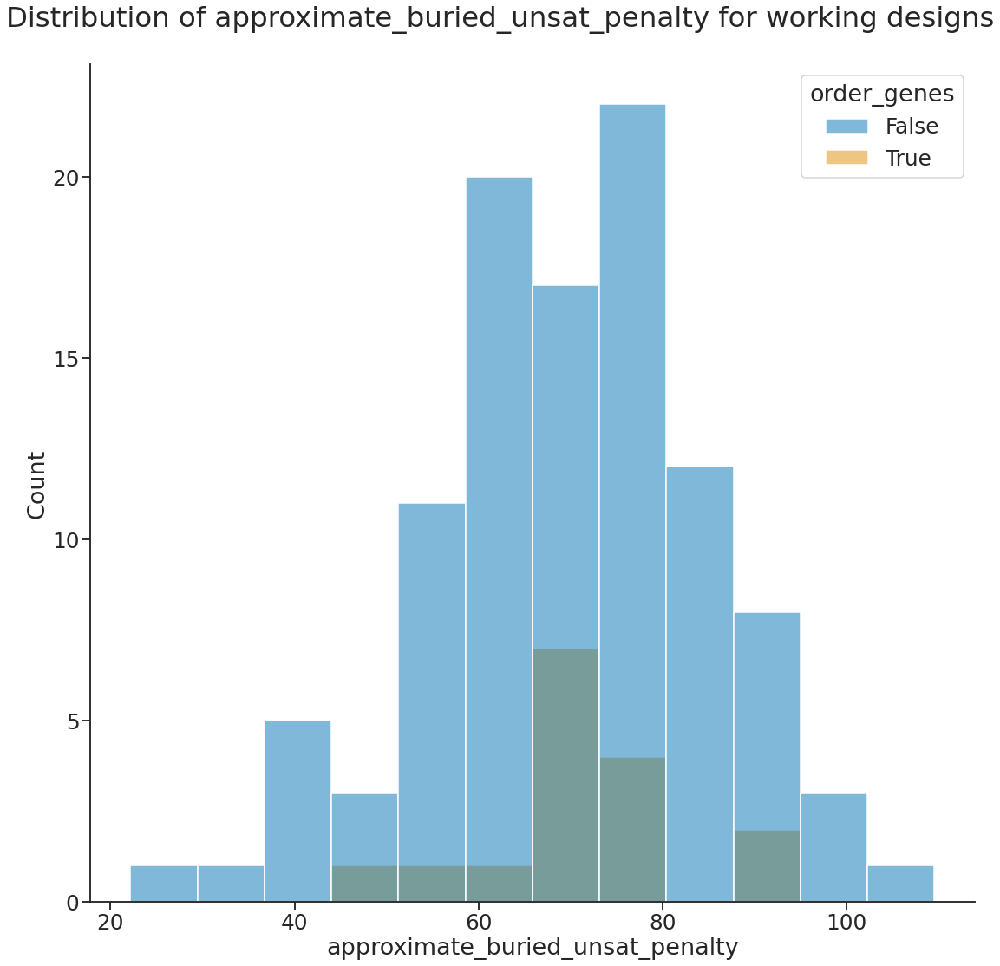

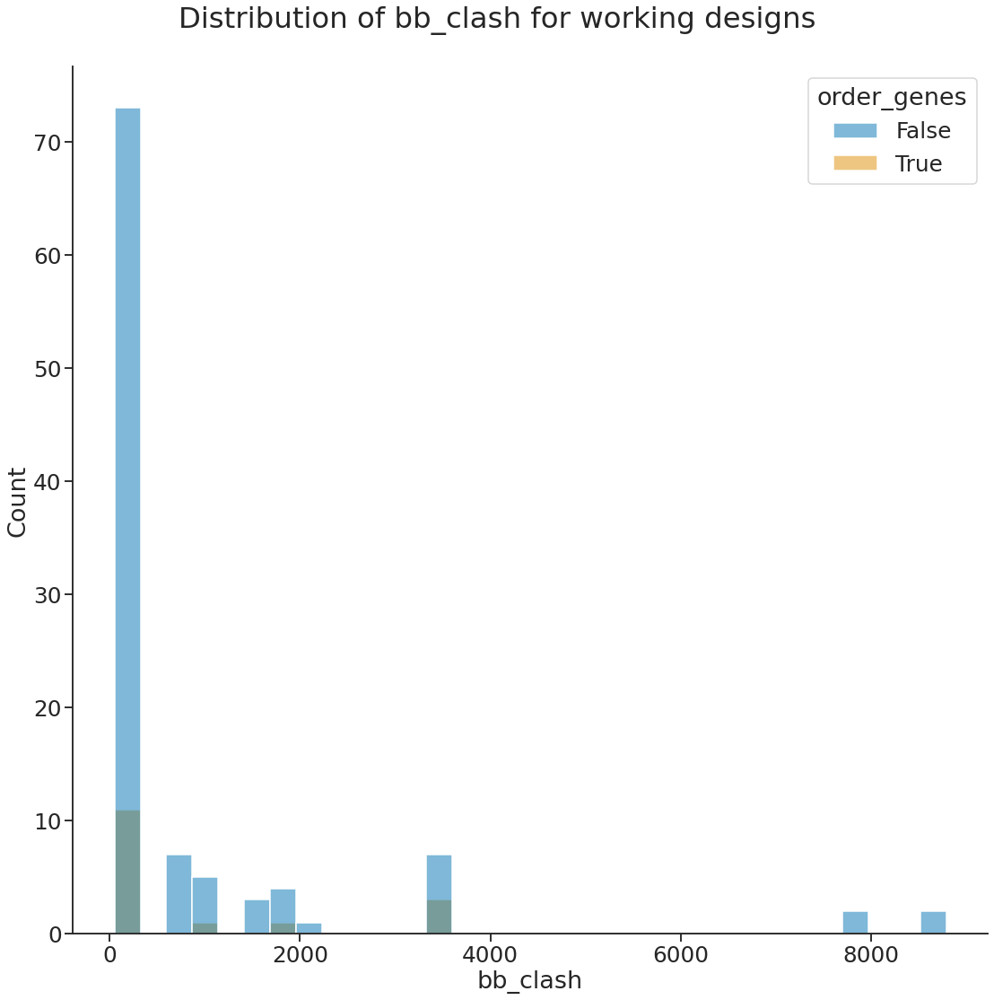

...

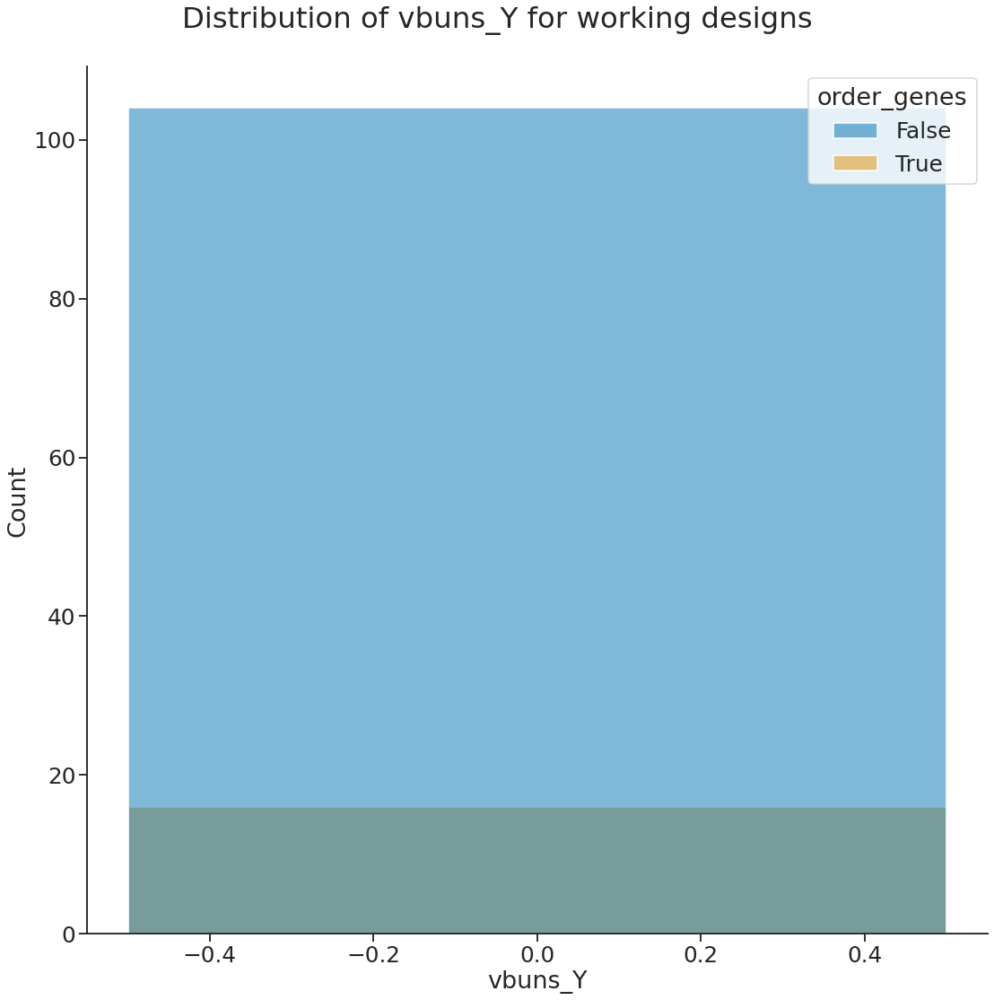

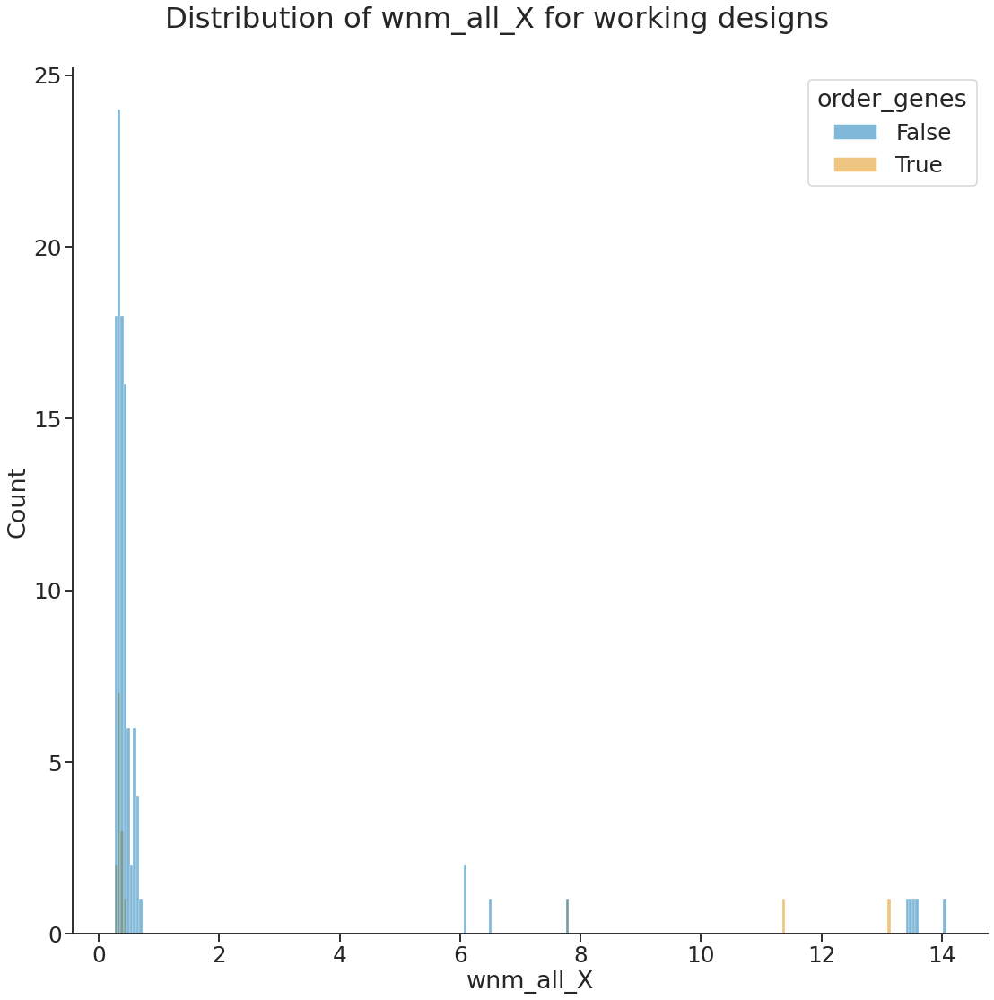

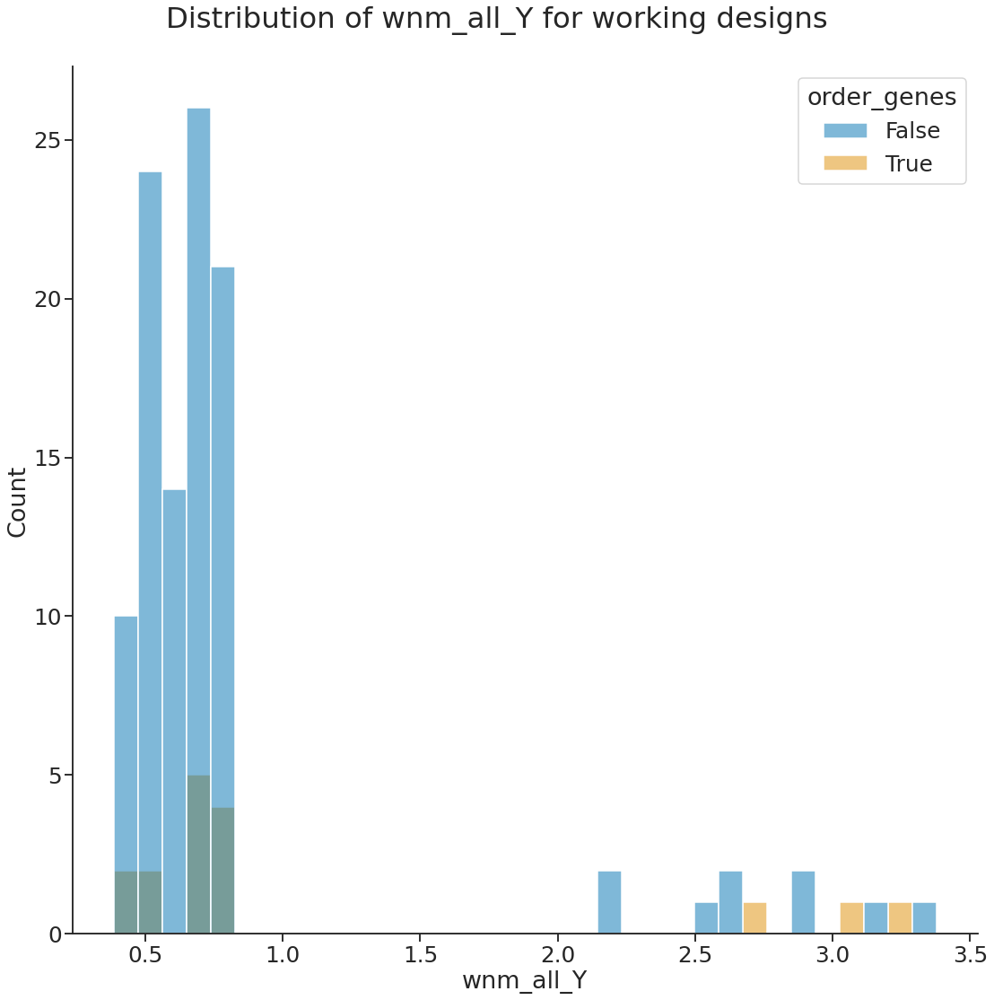

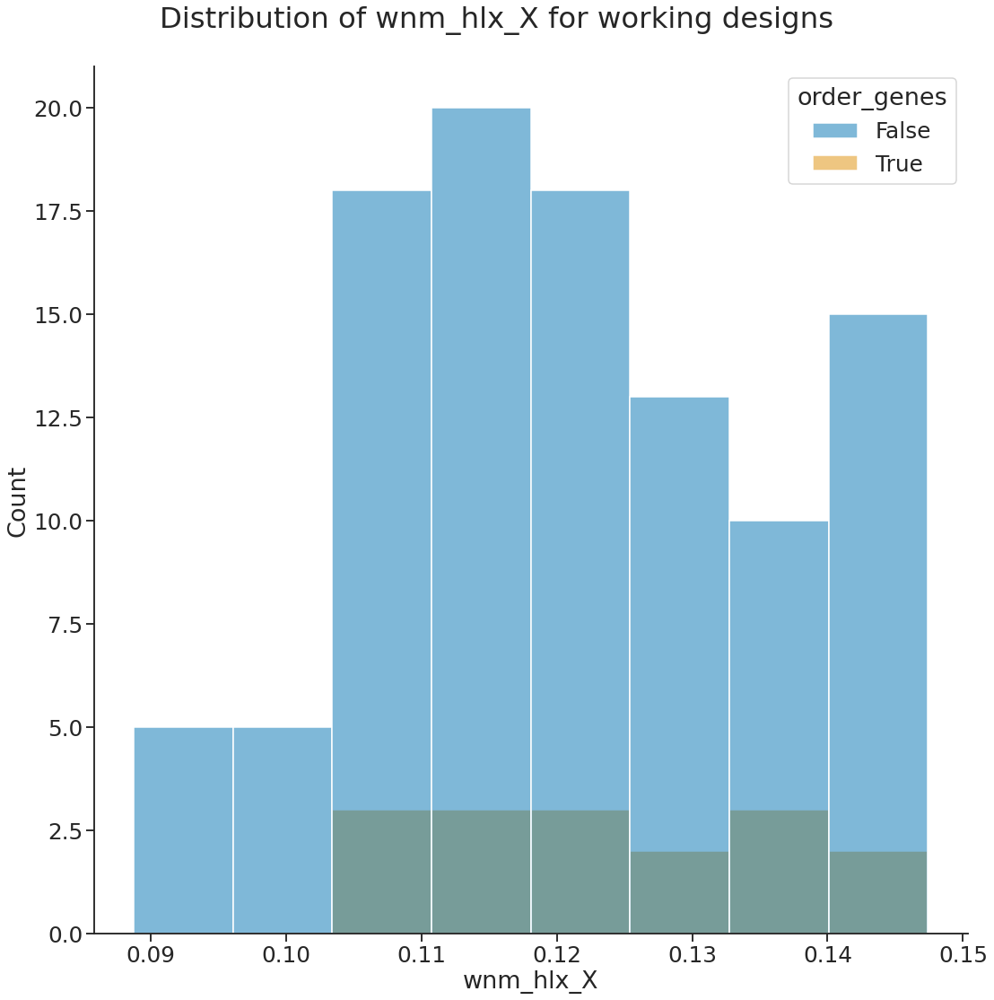

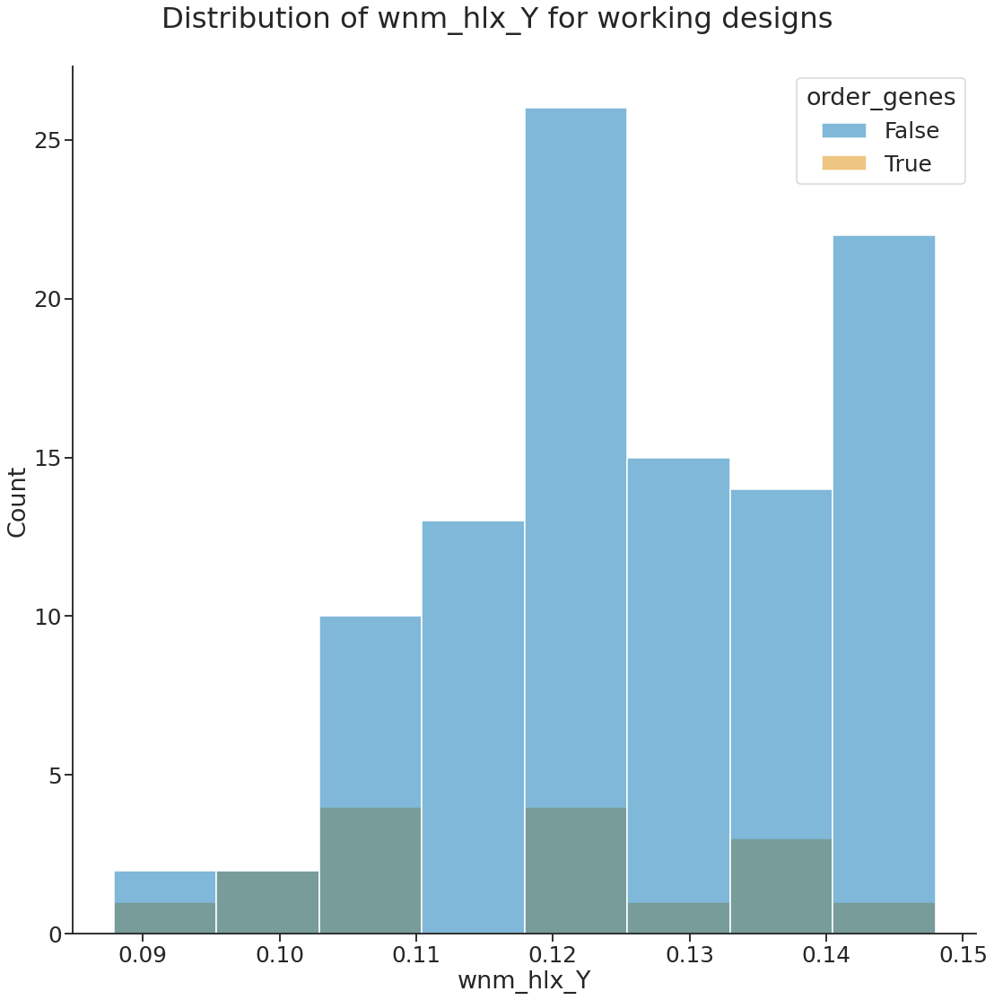

In [17]:
sns.set(
    context="talk",
    font_scale=1.5,  # make the font larger; default is pretty small
    style="ticks",  # make the background white with black lines
    palette="colorblind",  # a color palette that is colorblind friendly!
)

to_plot = [
    "9mer_X",
    "9mer_Y",
    "ala_penalty",
    "approximate_buried_unsat_penalty",
    "bb_clash",
    "bb_clash_Y",
    "buns_X",
    "buns_Y",
    "cms_Bc_Y",
    "cms_Y",
    "cms_nB_Y",
    "cms_nc_Y",
    "cmsa_AB_Y",
    "cmsa_AC_Y",
    "cmsa_BC_Y",
    "cmsa_int_Y",
    "ddg_Y",
    "docked_helix_Y",
    "dslf_fa13",
    "dslf_fa13_X",
    "dslf_fa13_Y",
    "dslf_fa13_cart_X",
    "dslf_fa13_cart_Y",
    "dslf_fa13_swap_Y",
    "exposed_hydrophobics_X",
    "exposed_hydrophobics_Y",
    "fa_atr",
    "fa_atr_X",
    "fa_atr_Y",
    "fa_dun_dev",
    "fa_dun_dev_X",
    "fa_dun_dev_Y",
    "fa_dun_rot",
    "fa_dun_rot_X",
    "fa_dun_rot_Y",
    "fa_dun_semi",
    "fa_dun_semi_X",
    "fa_dun_semi_Y",
    "fa_elec",
    "fa_elec_X",
    "fa_elec_Y",
    "fa_intra_atr_xover4",
    "fa_intra_atr_xover4_X",
    "fa_intra_atr_xover4_Y",
    "fa_intra_elec",
    "fa_intra_elec_X",
    "fa_intra_elec_Y",
    "fa_intra_rep_xover4",
    "fa_intra_rep_xover4_X",
    "fa_intra_rep_xover4_Y",
    "fa_intra_sol_xover4",
    "fa_intra_sol_xover4_X",
    "fa_intra_sol_xover4_Y",
    "fa_rep",
    "fa_rep_X",
    "fa_rep_Y",
    "fa_sol",
    "fa_sol_X",
    "fa_sol_Y",
    "geometry_X",
    "geometry_Y",
    "geometry_loop_X",
    "geometry_loop_Y",
    "hbond_bb_sc",
    "hbond_bb_sc_X",
    "hbond_bb_sc_Y",
    "hbond_lr_bb",
    "hbond_lr_bb_X",
    "hbond_lr_bb_Y",
    "hbond_sc",
    "hbond_sc_X",
    "hbond_sc_Y",
    "hbond_sr_bb",
    "hbond_sr_bb_X",
    "hbond_sr_bb_Y",
    "hxl_tors",
    "hxl_tors_X",
    "hxl_tors_Y",
    "interface_buried_sasa_Y",
    "lk_ball",
    "lk_ball_X",
    "lk_ball_Y",
    "lk_ball_bridge",
    "lk_ball_bridge_X",
    "lk_ball_bridge_Y",
    "lk_ball_bridge_uncpl",
    "lk_ball_bridge_uncpl_X",
    "lk_ball_bridge_uncpl_Y",
    "lk_ball_iso",
    "lk_ball_iso_X",
    "lk_ball_iso_Y",
    "mismatch_probability_X",
    "mismatch_probability_Y",
    "nmodes_attempts_X",
    "nmodes_attempts_Y",
    "np_penalty",
    "omega",
    "omega_X",
    "omega_Y",
    "p_aa_pp",
    "p_aa_pp_X",
    "p_aa_pp_Y",
    "parent_length_Y",
    "pivot_helix",
    "pivot_helix_Y",
    "pre_break_helix",
    "pre_break_helix_X",
    "pre_break_helix_Y",
    "pro_close",
    "pro_close_X",
    "pro_close_Y",
    "rama_prepro",
    "rama_prepro_X",
    "rama_prepro_Y",
    "ref",
    "ref_X",
    "ref_Y",
    "rmsd_cart_X",
    "rmsd_cart_Y",
    "rmsd_dual_X",
    "rmsd_dual_Y",
    "rmsd_final_X",
    "rmsd_final_Y",
    "rmsd_nmp_X",
    "rmsd_nmp_Y",
    "rmsd_swap_Y",
    "sap_A",
    "sap_B",
    "sap_C",
    "sap_D",
    "sap_Y",
    "sap_score_X",
    "sap_score_Y",
    "sasa_AB_Y",
    "sasa_AC_Y",
    "sasa_BC_Y",
    "sasa_Y",
    "sasa_int_Y",
    "sbuns_X",
    "sbuns_Y",
    "sc_X",
    "sc_Y",
    "sc_int_AB_Y",
    "sc_int_AC_Y",
    "sc_int_BC_Y",
    "sc_int_Y",
    "score_AB_Y",
    "score_AC_Y",
    "score_BC_Y",
    "score_Bc_X",
    "score_Bc_Y",
    "score_nB_X",
    "score_nB_Y",
    "score_nc_X",
    "score_nc_Y",
    "score_per_res_X",
    "score_per_res_Y",
    "tot_score_A",
    "tot_score_B",
    "tot_score_C",
    "tot_score_D",
    "tot_score_X",
    "tot_score_Y",
    "total_length",
    "total_length_X",
    "total_length_Y",
    "total_score",
    "total_score_X",
    "total_score_Y",
    "vbuns_X",
    "vbuns_Y",
    "wnm_all_X",
    "wnm_all_Y",
    "wnm_hlx_X",
    "wnm_hlx_Y",
]

for term in bound_df.columns:
    if term in to_plot:
        fig, ax = plt.subplots(figsize=(16, 16), tight_layout=True)
        sns.histplot(ax=ax, x=term, data=to_order, hue="order_genes")
        plt.suptitle(f"Distribution of {term} for working designs")
        sns.despine()
        plt.savefig(f"figs/08_{term}_working.png")

### Plot AF2 and lDDT scores

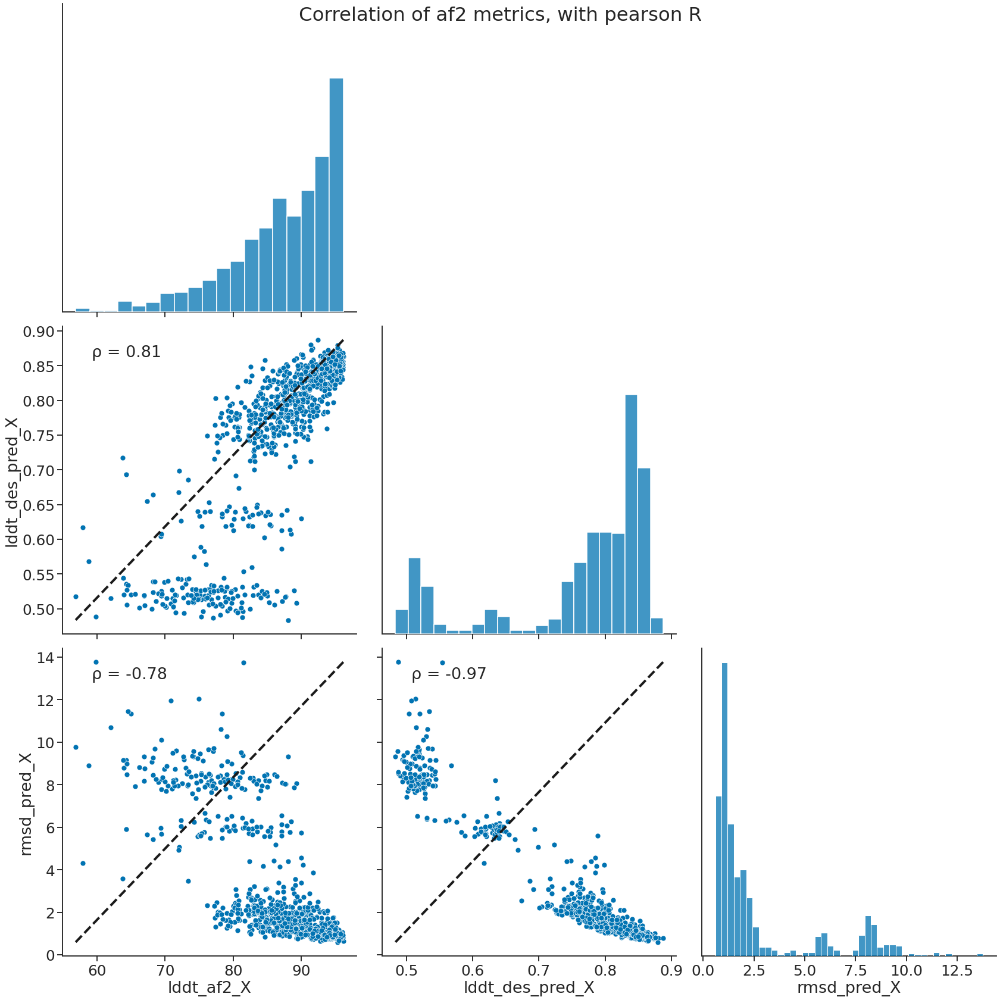

In [6]:

def rho(x, y, ax=None, **kwargs):
    """Plot the correlation coefficient in the top left hand corner of a plot.
    https://stackoverflow.com/questions/50832204/show-correlation-values-in-pairplot-using-seaborn-in-python/50835066
    """
    import scipy

    r, _ = scipy.stats.pearsonr(x, y)
    ax = ax or plt.gca()
    # Unicode for lowercase rho (ρ)
    rho = "\u03C1"
    ax.annotate(f"{rho} = {r:.2f}", xy=(0.1, 0.9), xycoords=ax.transAxes)


def plot_unity(xdata, ydata, **kwargs):
    """https://stackoverflow.com/questions/48122019/how-can-i-plot-identity-lines-on-a-seaborn-pairplot"""
    xmin, ymin = (xdata.min(), ydata.min())
    xmax, ymax = (xdata.max(), ydata.max())
    xpoints = np.linspace(xmin, xmax, 100)
    ypoints = np.linspace(ymin, ymax, 100)
    plt.gca().plot(
        xpoints, ypoints, color="k", marker=None, linestyle="--", linewidth=4.0
    )


subset = scores_df[
    [
        "lddt_af2_X",
        "lddt_des_pred_X",
        "rmsd_pred_X",
        "parent",
    ]
]

ax = sns.pairplot(data=subset, hue="parent", corner=True, height=8)
plt.suptitle("Correlation of af2 metrics, split by parent")
sns.despine()
plt.savefig("figs/07_correlations_af2_split_by_parent.png")

plt.close()

ax = sns.pairplot(data=subset, corner=True, height=8)
ax.map_lower(rho)
ax.map_offdiag(plot_unity)
plt.suptitle("Correlation of af2 metrics, with pearson R")
sns.despine()
plt.savefig("figs/07_correlations_af2_pearson.png")